In [1]:
from scipy.io import arff
import pandas as pd


index_column=["White King file",
 "White King rank",
 "White Rook file",
  "White Rook rank",
  "Black King file",
   "Black King rank","Target"]

Win_move_vs_draw=pd.read_csv("krkopt.DATA",sep=",",header=None, names=index_column)


In [2]:
class_labels=Win_move_vs_draw["Target"].unique()
Win_move_vs_draw

,White King file,White King rank,White Rook file,White Rook rank,Black King file,Black King rank,Target
0,a,1,b,3,c,2,draw
1,a,1,c,1,c,2,draw
2,a,1,c,1,d,1,draw
3,a,1,c,1,d,2,draw
4,a,1,c,2,c,1,draw
...,...,...,...,...,...,...,...
28051,b,1,g,7,e,5,sixteen
28052,b,1,g,7,e,6,sixteen
28053,b,1,g,7,e,7,sixteen
28054,b,1,g,7,f,5,sixteen


In [3]:
categorical_columns = Win_move_vs_draw.select_dtypes(include=['object']).columns

# Convert categorical columns to numeric categories
Win_move_vs_draw[categorical_columns] = Win_move_vs_draw[categorical_columns].astype('category').apply(lambda x: x.cat.codes)

In [4]:
import numpy as np
from sklearn.model_selection import train_test_split
df = Win_move_vs_draw

#   the target and the rest are features
X = df.drop('Target', axis=1)
y = df['Target']

indices = np.arange(len(X))
np.random.shuffle(indices)

# Use the shuffled indices for splitting the data
X = X.iloc[indices]

X = pd.get_dummies(X, columns=X.select_dtypes(include=['object']).columns)

y = y[indices]

#split into test,train dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [6]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer, matthews_corrcoef
import os


# Define parameter distributions for XGBoost
param_dist_xgb = {
    'learning_rate': [0.01, 0.1, 0.2,0.5,0.7],
    'n_estimators': [ 30,40,20,40,60,80,200,300,400],
    'max_depth': [2,5,8,10,15],
    'subsample': [0.8,  1.0],
    'colsample_bytree': [0.8,  1.0],
    "lambda":[0.001,0.1,0.5,0.9, 1,1.1],
      # Adjust scale_pos_weight for imbalance"scale_pos_weight": [1, 2, 3]
}

# Define parameter distributions for RandomForest
param_dist_rf = {
    'n_estimators': [10,20,40,60,80,100, 150,200,250,500],
    'max_depth': [20,25,30,50,100,250],
    'min_samples_split': [4, 5, 10,30,50,70],
    'min_samples_leaf': [1,2,4,10,30,50,70],
    'criterion': ['gini', 'entropy'],  # Experiment with 'entropy'
    'class_weight': ['balanced', None]  # Adjust class weights
}

# Define parameter distributions for DecisionTree[10,20,40,60,80,90,100,130,150,250,350]
param_dist_dt = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [10,20,40,60,80,90,100,130,150,250,350],
    'min_samples_split': [2,3,4,5,6,10,30,70],
    'min_samples_leaf': [1,2,3,10,30,70]
}

# Define parameter distributions for Bagging 'base_estimator__class_weight': ['balanced', None] # Experiment with 'entropy''base_estimator__criterion': ['gini', 'entropy'], 
param_dist_bagging = {
    'n_estimators': [10,20,40,60,80,100,150,200,300,400,500],
    'max_samples': [0.8, 1.0],
    'max_features': [1.0],
    
     # Adjust class weights
}

# Instantiate models
xgb_model = xgb.XGBClassifier(objective="multi:softprob", eval_metric='mlogloss', random_state=42)
rf_model = RandomForestClassifier(random_state=42)
dt_model = DecisionTreeClassifier(random_state=42)
bagging_model = BaggingClassifier(estimator=dt_model, random_state=42)



# Perform RandomizedSearchCV
random_search_xgb = RandomizedSearchCV(xgb_model, param_distributions=param_dist_xgb, n_iter=20, cv=5, scoring="f1_micro")
random_search_rf = RandomizedSearchCV(rf_model, param_distributions=param_dist_rf, n_iter=20, cv=5, scoring="f1_micro")
random_search_dt = RandomizedSearchCV(dt_model, param_distributions=param_dist_dt, n_iter=20, cv=5, scoring="f1_micro")
random_search_bagging = RandomizedSearchCV(bagging_model, param_distributions=param_dist_bagging, n_iter=20, cv=5, scoring="f1_micro")

# Fit the models
%time random_search_xgb.fit(X_train, y_train)
%time random_search_rf.fit(X_train, y_train)
%time random_search_dt.fit(X_train, y_train)
%time random_search_dt.fit(X_train, y_train)
%time random_search_bagging.fit(X_train, y_train)

CPU times: total: 9min 49s
Wall time: 5min 36s
CPU times: total: 2min 30s
Wall time: 2min 35s
CPU times: total: 2.91 s
Wall time: 3.01 s
CPU times: total: 2.69 s
Wall time: 2.74 s
CPU times: total: 8min 13s
Wall time: 8min 28s


RandomizedSearchCV(cv=5,
                   estimator=BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42),
                                               random_state=42),
                   n_iter=20,
                   param_distributions={'max_features': [1.0],
                                        'max_samples': [0.8, 1.0],
                                        'n_estimators': [10, 20, 40, 60, 80,
                                                         100, 150, 200, 300,
                                                         400, 500]},
                   scoring='f1_micro')

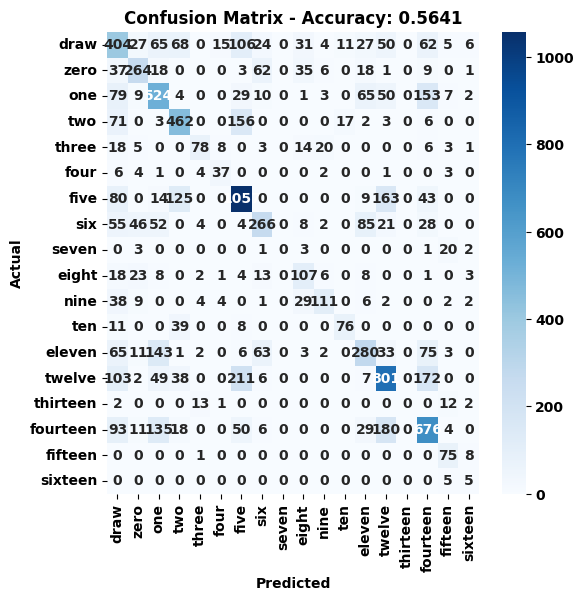

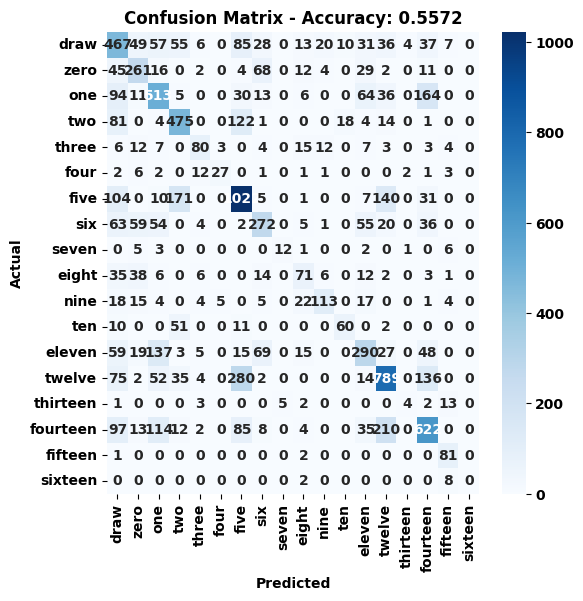

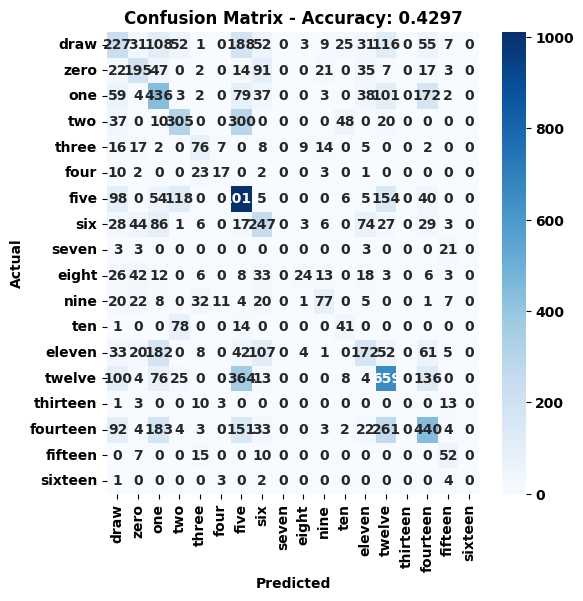

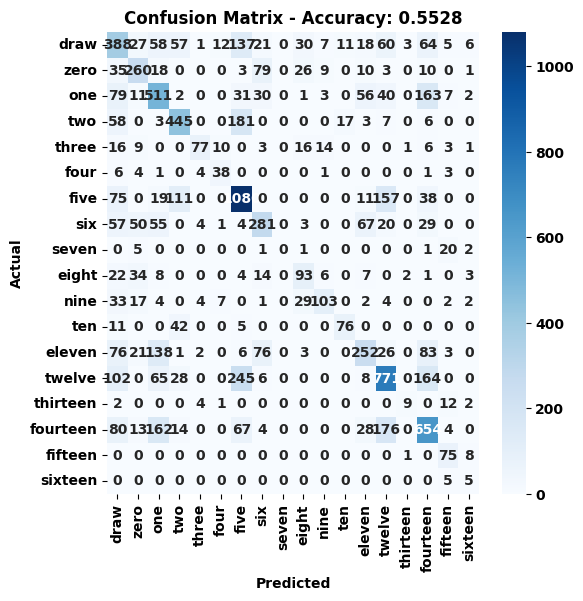

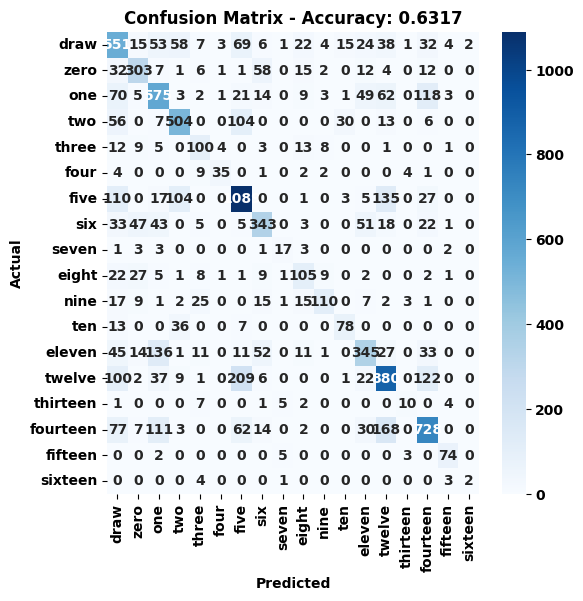

...

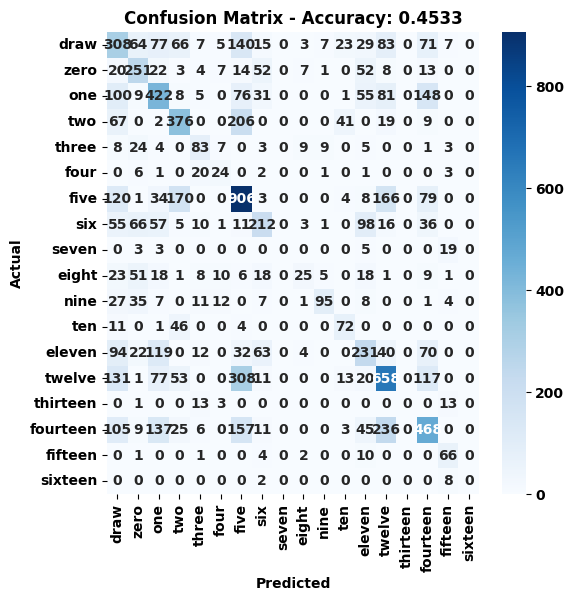

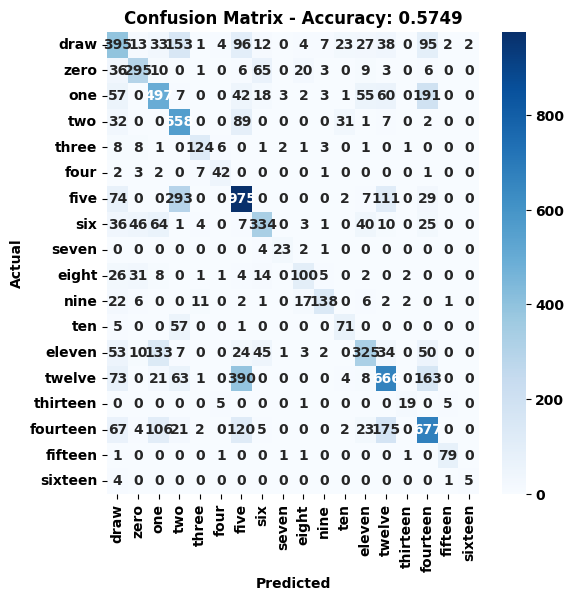

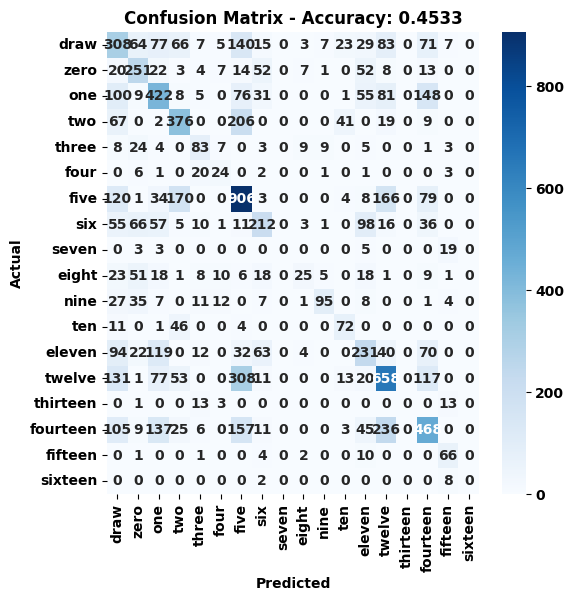

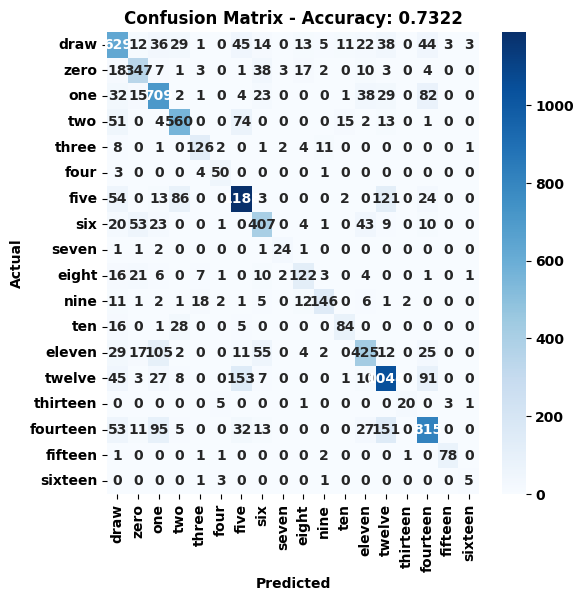

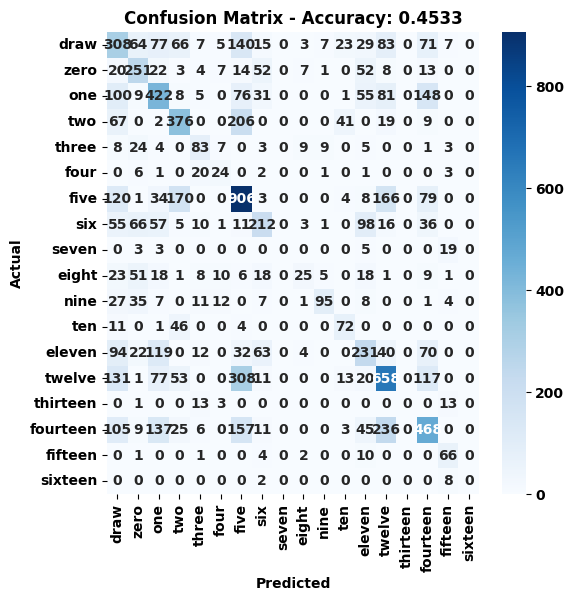

   splitter  min_samples_split  min_samples_leaf  max_depth criterion  \
0      best                 70                10        100   entropy   
1    random                 10                10        100      gini   
2    random                 30                70         20      gini   
3      best                 30                30         60   entropy   
4      best                  3                10        250      gini   
5      best                  4                 3        350   entropy   
6    random                  4                30        150   entropy   
7      best                  5                 1        130      gini   
8    random                  5                 1         10   entropy   
9    random                  3                 1        130   entropy   
10     best                 30                10         80      gini   
11   random                  6                70         10      gini   
12   random                 10                 2   

In [7]:
import pandas as pd
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split

# Assuming you have a list of models and their hyperparameters
hyperparameters_list = random_search_dt.cv_results_['params']

accuracies = []

for i in range(len(hyperparameters_list)):
    hyperparameters = hyperparameters_list[i].copy()
    
    # Instantiate DecisionTreeClassifier with the given hyperparameters
    model = DecisionTreeClassifier(**hyperparameters, random_state=42)
    
    # Fit the model
    model.fit(X_train, y_train)
    
    # Make predictions
    predictions = model.predict(X_test)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, predictions)

    # Create a confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Plot confusion matrix
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True,fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - Accuracy: {accuracy:.4f}")
    
    folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/descisiontree'

    # Specifying the file name and join it with the folder path
    file_path = os.path.join(folder_path, f'DecisionTreeClassifier{accuracy}.png')

    # Save the plot
    plt.savefig(file_path)
    plt.show()

    # Store hyperparameters and accuracy
    hyperparameters['Accuracy'] = accuracy
    accuracies.append(hyperparameters)

# Create a DataFrame
results_df = pd.DataFrame(accuracies)





# Display the results
print(results_df)




In [8]:
from IPython.display import display
pd.set_option('display.max_rows', None)
display(results_df)

,splitter,min_samples_split,min_samples_leaf,max_depth,criterion,Accuracy
0,best,70,10,100,entropy,0.564100
1,random,10,10,100,gini,0.557188
2,random,30,70,20,gini,0.429744
3,best,30,30,60,entropy,0.552759
4,best,3,10,250,gini,0.631710
5,best,4,3,350,entropy,0.741765
6,random,4,30,150,entropy,0.453289
7,best,5,1,130,gini,0.766929
8,random,5,1,10,entropy,0.484178
9,random,3,1,130,entropy,0.689059


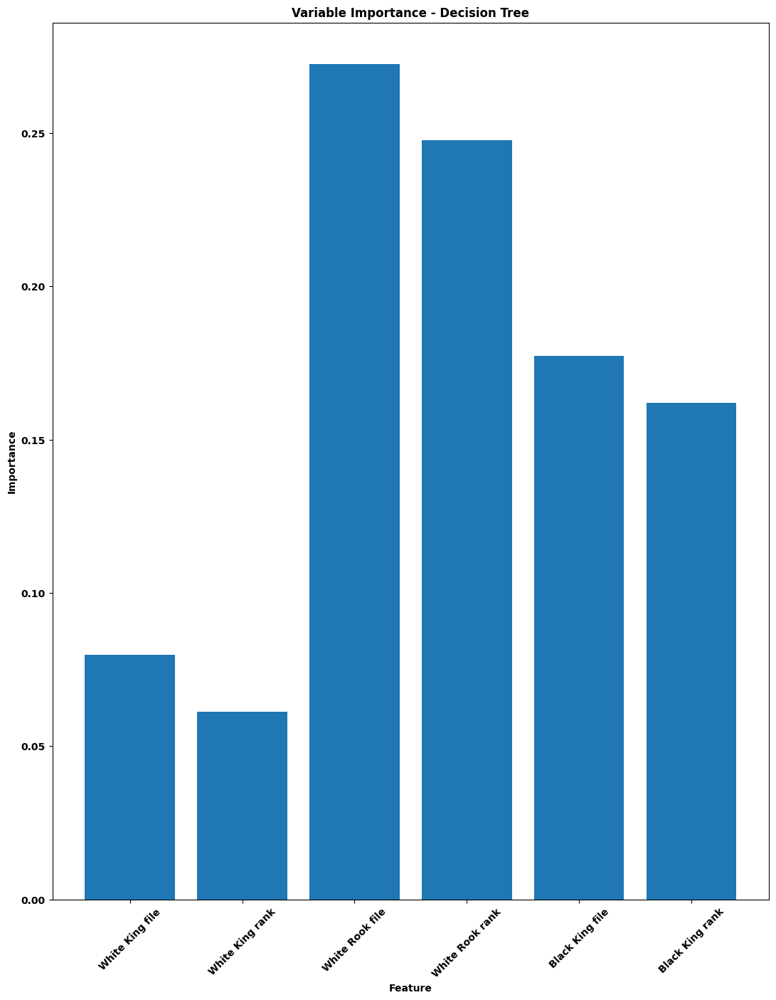

In [9]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
import os


Best_parameter=random_search_dt.best_params_


# Decision Tree with pruning hyperparameters
dt_model = DecisionTreeClassifier(**Best_parameter, random_state=42)
dt_model.fit(X, y)

# Get feature importances
importances = dt_model.feature_importances_

# Get feature names
feature_names = df.columns

# Sort features by importance
indices = np.array(range(6))

# Plot the feature importances
plt.figure(figsize=(13, 16))
plt.bar(range(6), importances[indices], align="center")
plt.xticks(range(6), [feature_names[i] for i in indices], rotation=45)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Variable Importance - Decision Tree")

folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/descisiontree'

# Specifying the file name  and join it with the folder path
file_path = os.path.join(folder_path, f' DecisionTreeClassifier_variable.png')

# Save the plot
plt.savefig(file_path)
plt.show()

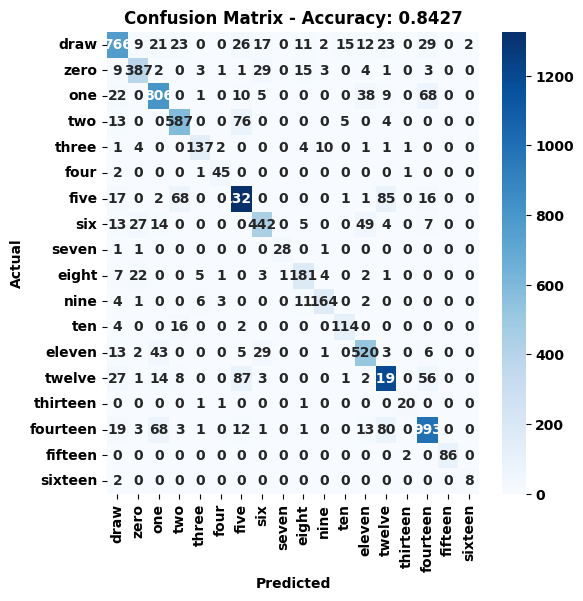

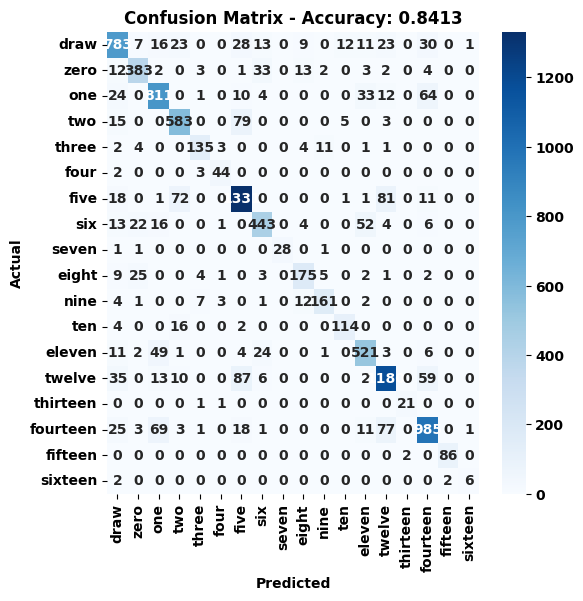

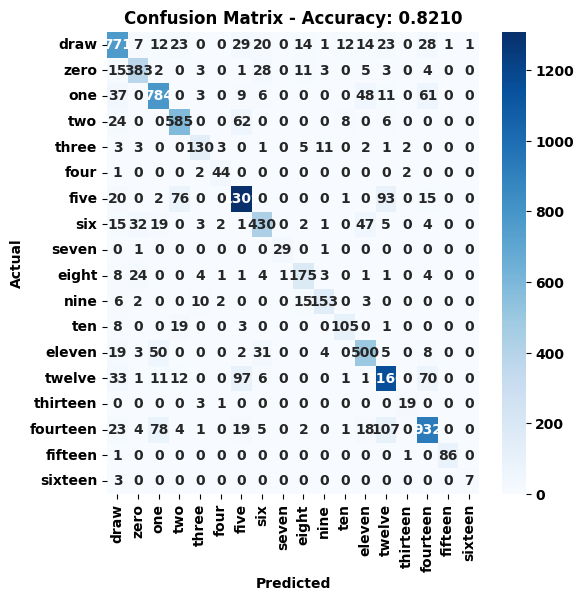

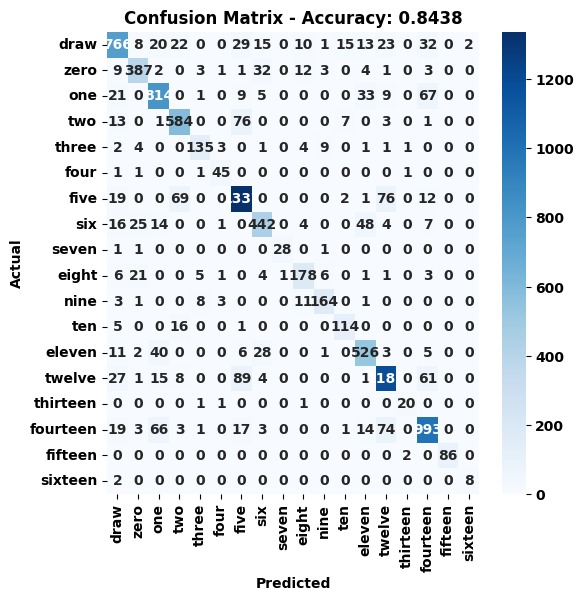

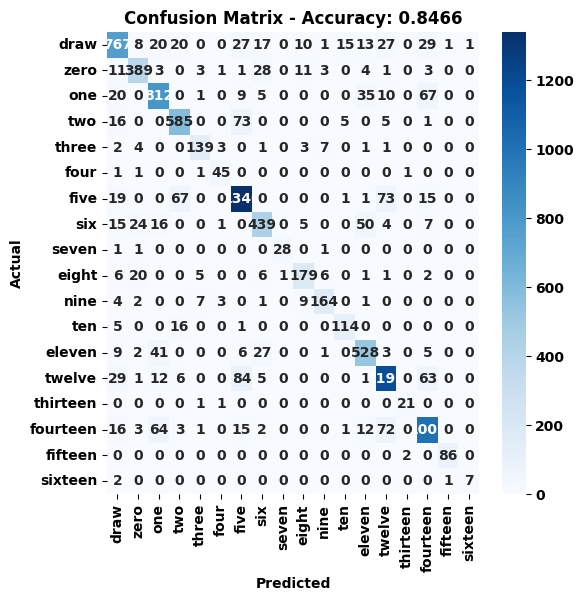

...

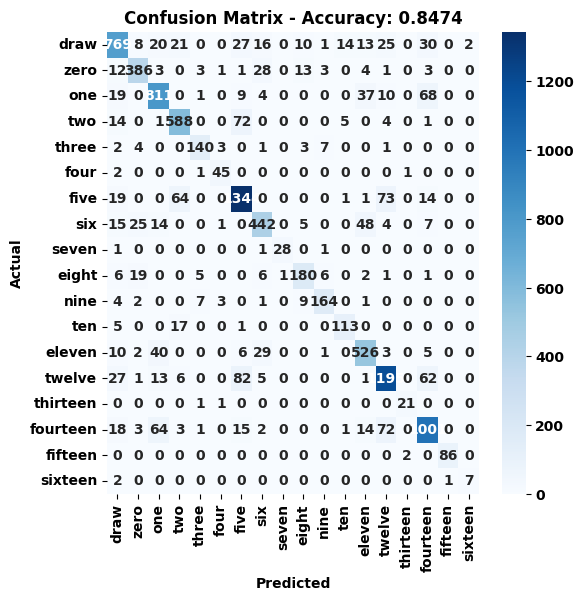

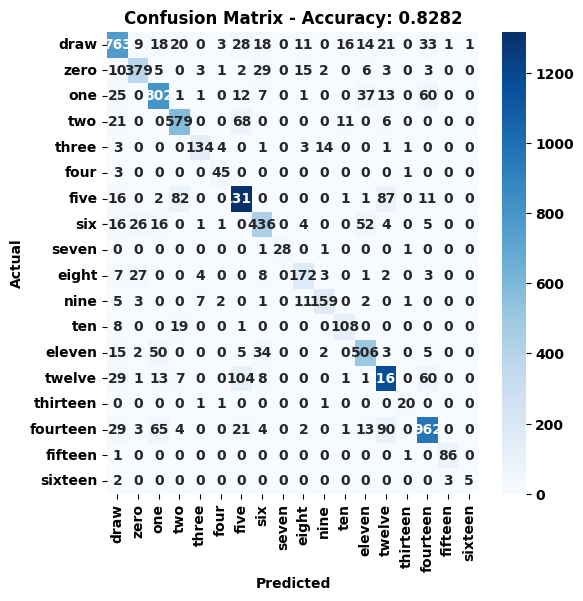

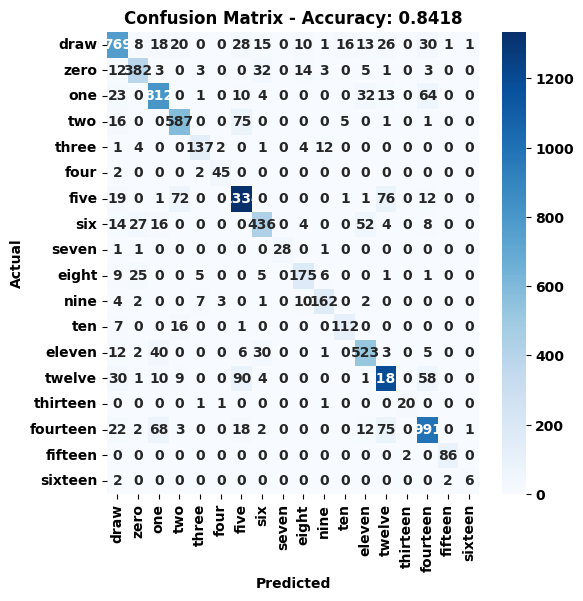

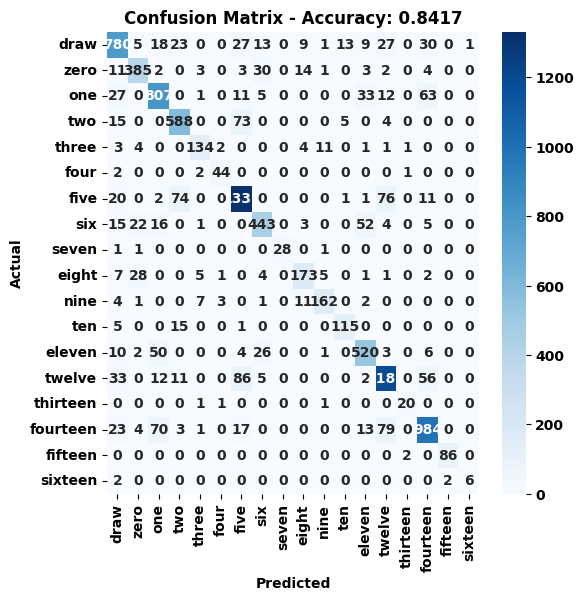

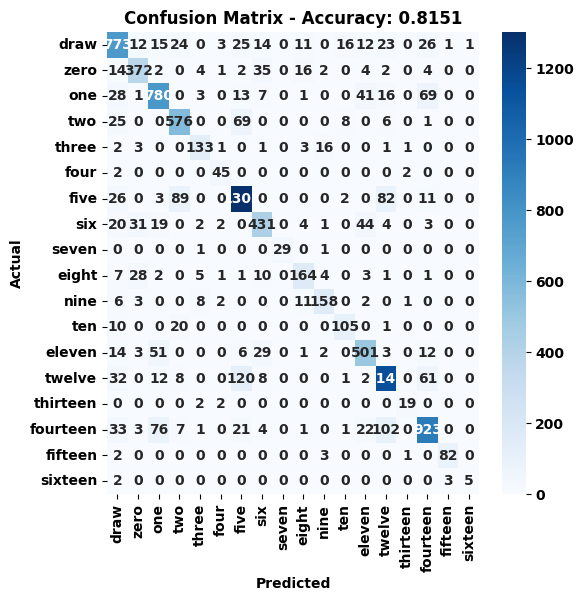

    n_estimators  max_samples  max_features  Accuracy
0             80          1.0           1.0  0.842748
1             80          0.8           1.0  0.841344
2             10          1.0           1.0  0.821039
3            200          1.0           1.0  0.843828
4            500          1.0           1.0  0.846636
5            400          0.8           1.0  0.842100
6            150          0.8           1.0  0.841776
7            150          1.0           1.0  0.843828
8             40          0.8           1.0  0.838751
9            300          1.0           1.0  0.846744
10           200          0.8           1.0  0.841344
11           100          0.8           1.0  0.840804
12            60          1.0           1.0  0.843072
13            40          1.0           1.0  0.840912
14            20          1.0           1.0  0.834215
15           400          1.0           1.0  0.847392
16            20          0.8           1.0  0.828167
17           500          0.

In [13]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import pandas as pd
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
import matplotlib.pyplot as plt
import os

#  list of models and their hyperparameters
hyperparameters_list = random_search_bagging.cv_results_['params']

accuracies = []

# Instantiate a DecisionTreeClassifier (default base estimator for BaggingClassifier)
base_estimator = DecisionTreeClassifier(random_state=42)

for i in range(len(hyperparameters_list)):
    hyperparameters = hyperparameters_list[i].copy()  # Create a shallow copy
    
    # Instantiate BaggingClassifier with the given hyperparameters
    model = BaggingClassifier(estimator=base_estimator, **hyperparameters, random_state=42)
    
    # Fit the model
    model.fit(X_train, y_train)
    
    # Make predictions
    predictions = model.predict(X_test)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, predictions)
    
      # Create a confusion matrix
    cm = confusion_matrix(y_test, predictions)

    # Plot confusion matrix
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True,fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - Accuracy: {accuracy:.4f}")
    
    folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/bagging'

    # Specifying the file name  and join it with the folder path
    file_path = os.path.join(folder_path, f' BaggingClassifier{accuracy}.png')

    # Save the plot
    plt.savefig(file_path)
    
    plt.show()
    # Store hyperparameters and accuracy
    hyperparameters['Accuracy'] = accuracy
    accuracies.append(hyperparameters)

# Create a DataFrame
results_df = pd.DataFrame(accuracies)

# Display the results
print(results_df)

In [14]:
from IPython.display import display
pd.set_option('display.max_rows', None)
display(results_df)

,n_estimators,max_samples,max_features,Accuracy
0,80,1.0,1.0,0.842748
1,80,0.8,1.0,0.841344
2,10,1.0,1.0,0.821039
3,200,1.0,1.0,0.843828
4,500,1.0,1.0,0.846636
5,400,0.8,1.0,0.842100
6,150,0.8,1.0,0.841776
7,150,1.0,1.0,0.843828
8,40,0.8,1.0,0.838751
9,300,1.0,1.0,0.846744


C:\Users\rasyd\anaconda3\envs\in4080_2022\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


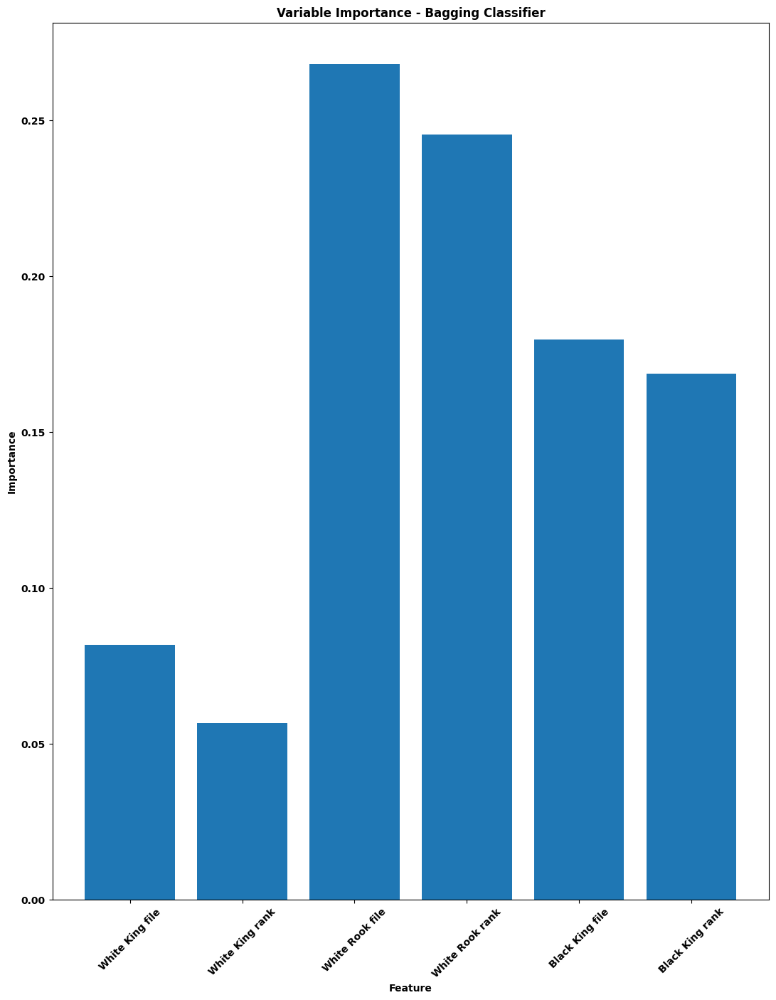

In [15]:
import numpy as np
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
import os


# Instantiate a DecisionTreeClassifier (default base estimator for BaggingClassifier)
base_estimator = DecisionTreeClassifier(random_state=42)

# Get the best hyperparameters
best_hyperparameters_bagging = random_search_bagging.best_params_

# Instantiate BaggingClassifier with the best hyperparameters
bagging_model = BaggingClassifier(base_estimator=base_estimator, **best_hyperparameters_bagging, random_state=42)

# Fit the model
bagging_model.fit(X, y)

# Calculate feature importances by averaging over base estimators
importances_bagging = np.mean([tree.feature_importances_ for tree in bagging_model.estimators_], axis=0)

# Get feature names
feature_names_bagging = df.columns

# Sort features by importanceimportances_bagging.argsort()[::-1]
indices_bagging = np.array(range(6))

# Plot the feature importances for BaggingClassifier
plt.figure(figsize=(13, 16))
plt.bar(range(6), importances_bagging, align="center")
plt.xticks(range(6), [feature_names_bagging[i] for i in indices_bagging], rotation=45)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Variable Importance - Bagging Classifier")

folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/bagging'

# Specifying the file name  and join it with the folder path
file_path = os.path.join(folder_path, f' BaggingClassifier_variable.png')

# Save the plot
plt.savefig(file_path)
plt.show()



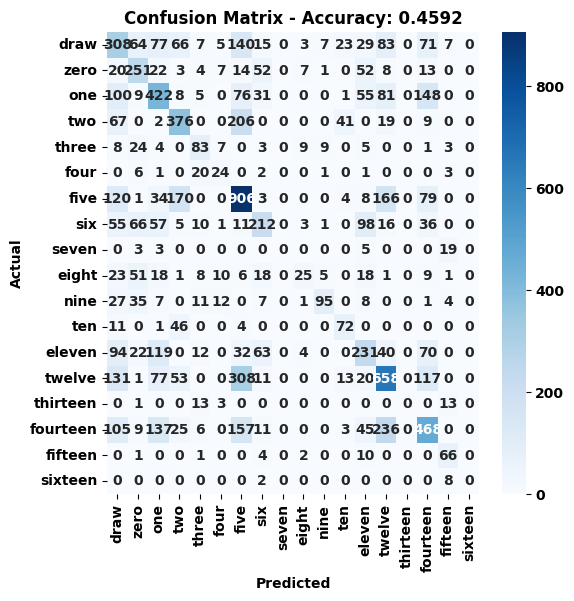

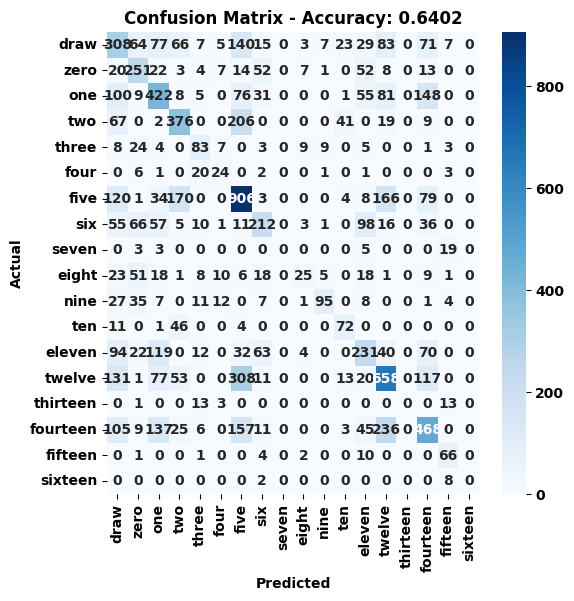

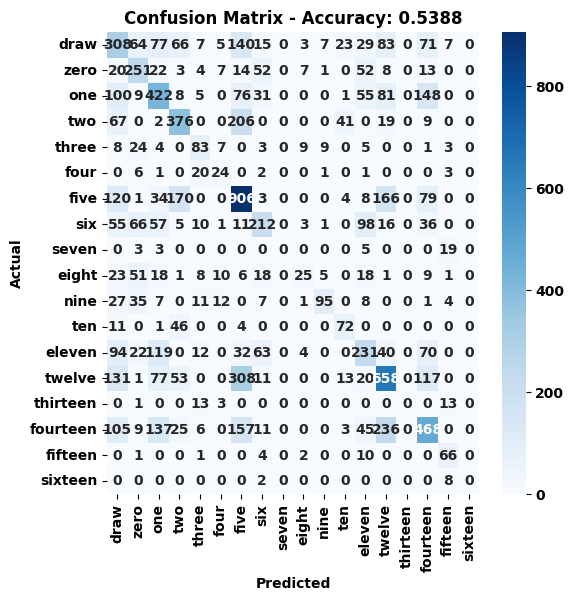

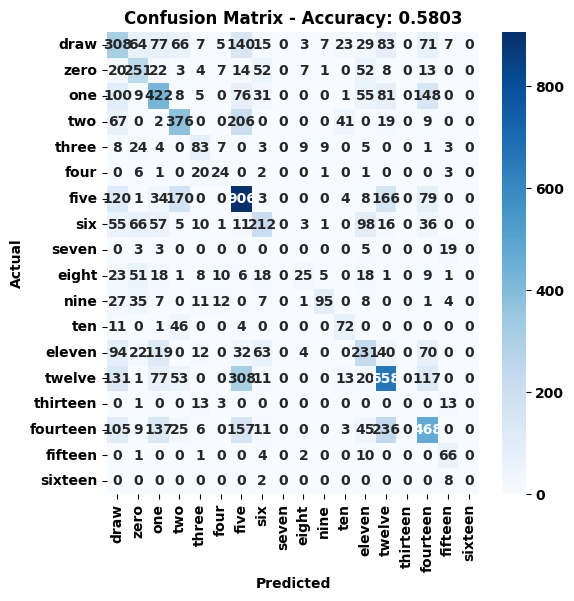

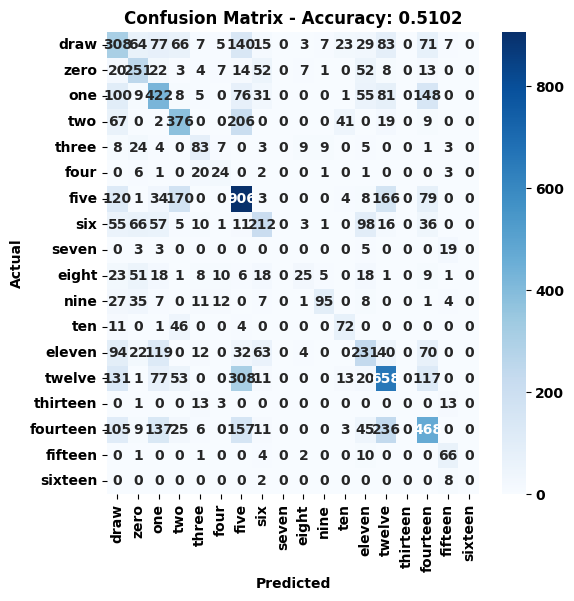

...

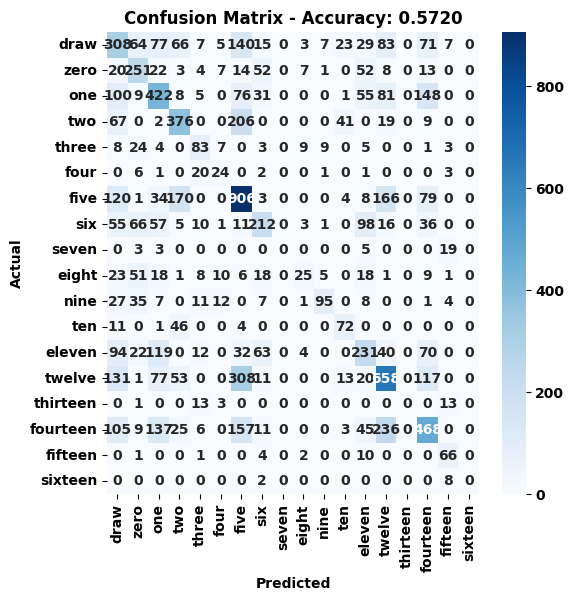

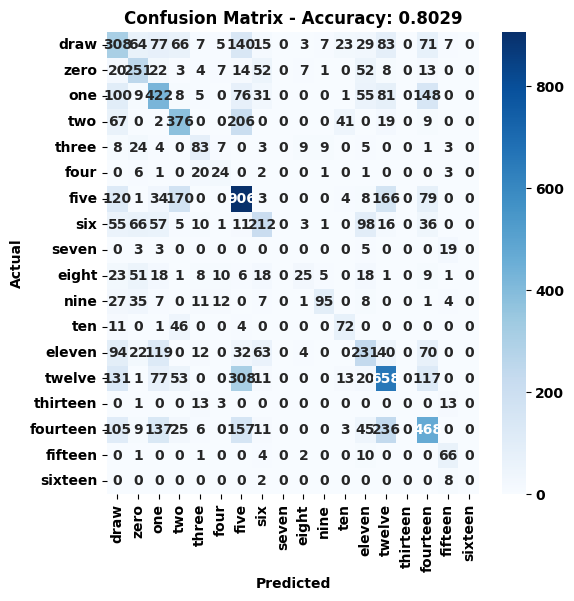

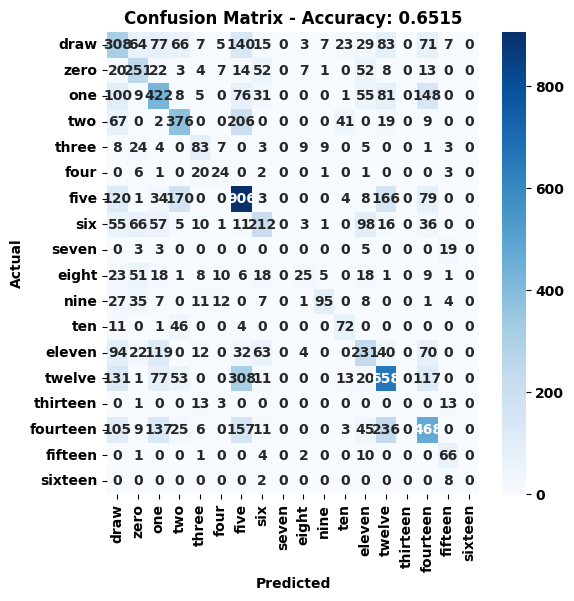

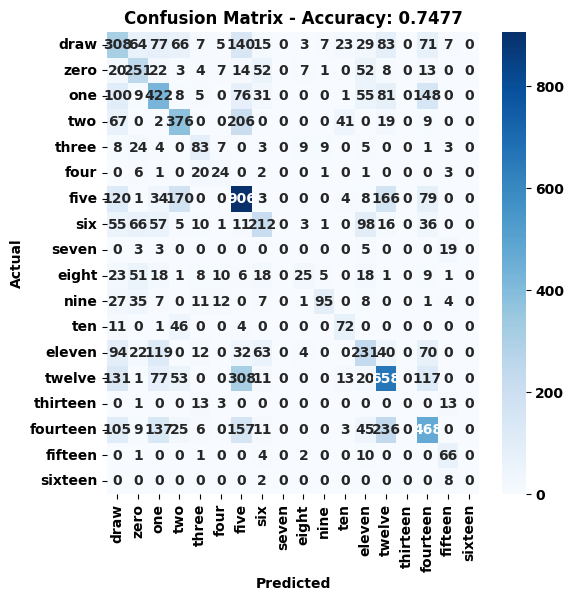

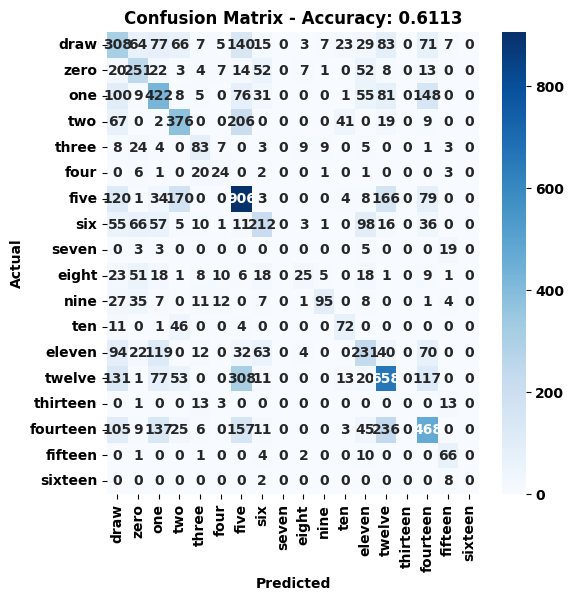

    n_estimators  min_samples_split  min_samples_leaf  max_depth criterion  \
0             40                 50                70        250      gini   
1            100                  4                10         20   entropy   
2             80                  5                30         30      gini   
3             40                 50                 1         50      gini   
4            250                 30                50         20   entropy   
5            200                 70                 1         20      gini   
6             40                  5                 4         25   entropy   
7             20                  4                 2         50   entropy   
8             10                 50                 4         25   entropy   
9            500                 50                10         50   entropy   
10           250                  5                 1         50   entropy   
11           100                 50                 2        100

In [10]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import pandas as pd
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
import matplotlib.pyplot as plt
import os
#  list of models and their hyperparameters
hyperparameters_list_rf = random_search_rf.cv_results_['params']


accuracies_rf = []

# Instantiate RandomForestClassifier
rf_model = RandomForestClassifier(random_state=42)

for i in range(len(hyperparameters_list_rf)):
    hyperparameters_rf = hyperparameters_list_rf[i].copy()  # Create a shallow copy
    
    # Instantiate RandomForestClassifier with the given hyperparameters
    model_rf = RandomForestClassifier(**hyperparameters_rf, random_state=42)
    
    # Fit the model
    model_rf.fit(X_train, y_train)
    
    # Make predictions
    predictions_rf = model_rf.predict(X_test)
    
    # Calculate accuracy
    accuracy_rf = accuracy_score(y_test, predictions_rf)
    
    cm = confusion_matrix(y_test, predictions)

    # Plot confusion matrix
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True,fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - Accuracy: {accuracy_rf:.4f}")
    
    folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/randomforest/'

    # Specifying the file name  and join it with the folder path
    file_path = os.path.join(folder_path, f'RandomForestClassifier_variable{accuracy_rf}.png')

    # Save the plot
    plt.savefig(file_path)
    plt.show()
    
    # Store hyperparameters and accuracy
    hyperparameters_rf['Accuracy'] = accuracy_rf
    accuracies_rf.append(hyperparameters_rf)

# Create a DataFrame
results_df_rf = pd.DataFrame(accuracies_rf)

# Display the results
print(results_df_rf)

In [11]:
from IPython.display import display
pd.set_option('display.max_rows', None)
display(results_df_rf)

,n_estimators,min_samples_split,min_samples_leaf,max_depth,criterion,class_weight,Accuracy
0,40,50,70,250,gini,balanced,0.459229
1,100,4,10,20,entropy,balanced,0.640242
2,80,5,30,30,gini,balanced,0.538827
3,40,50,1,50,gini,balanced,0.580300
4,250,30,50,20,entropy,None,0.510206
5,200,70,1,20,gini,None,0.585160
6,40,5,4,25,entropy,balanced,0.724052
7,20,4,2,50,entropy,None,0.762717
8,10,50,4,25,entropy,None,0.578572
9,500,50,10,50,entropy,None,0.608165


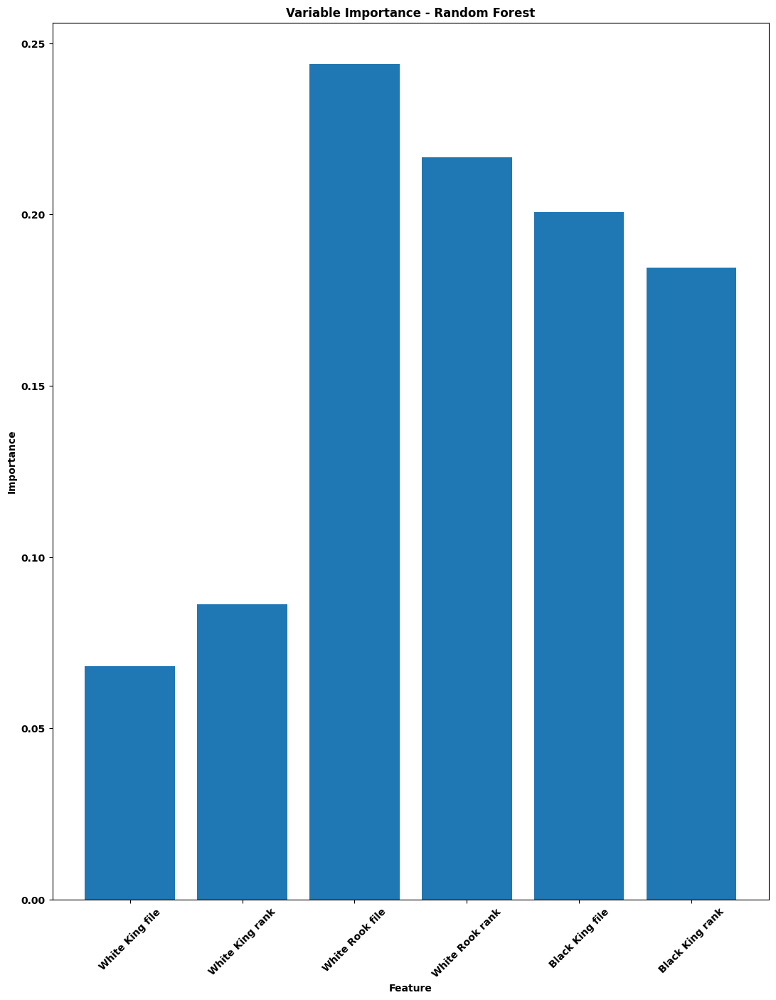

In [12]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
import matplotlib.pyplot as plt
import os


# Getting the best hyperparameters
best_hyperparameters_rf = random_search_rf.best_params_

# Instantiate RandomForestClassifier with the best hyperparameters
rf_model = RandomForestClassifier(**best_hyperparameters_rf, random_state=42)

# Fitting the model
rf_model.fit(X, y)

# Calculate feature importances
importances_rf = rf_model.feature_importances_

# Get feature names
feature_names_rf = df.columns

# Sort features by importance
indices_rf = range(X.shape[1])

# Plot the feature importances for RandomForestClassifier
plt.figure(figsize=(13, 16))
plt.bar(range(X.shape[1]), importances_rf[indices_rf], align="center")
plt.xticks(range(X.shape[1]), [feature_names_rf[i] for i in indices_rf], rotation=45)
plt.xlabel("Feature")
plt.ylabel("Importance")
plt.title("Variable Importance - Random Forest")

folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/randomforest'

# Specifying the file name  and join it with the folder path
file_path = os.path.join(folder_path, f' RandomForestClassifier_variable.png')

# Save the plot
plt.savefig(file_path)
plt.show()


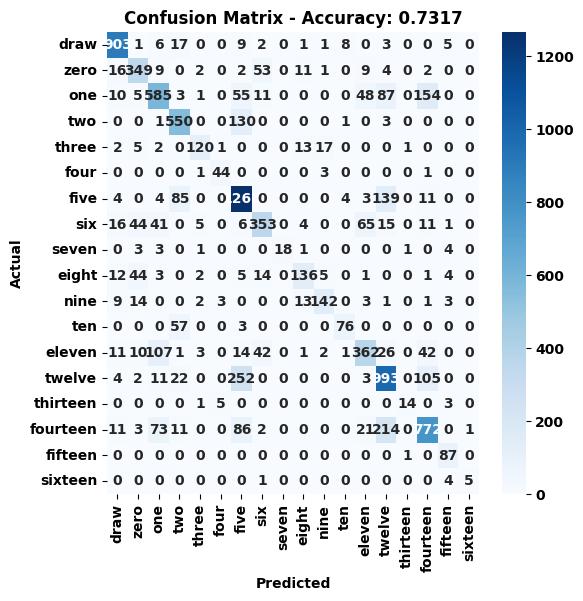

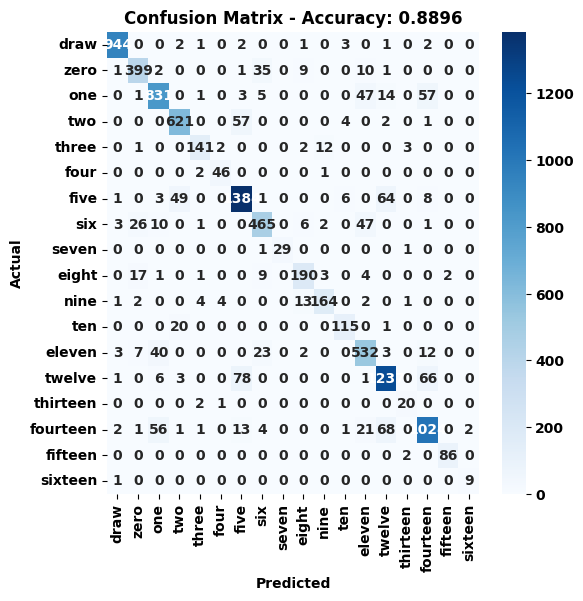

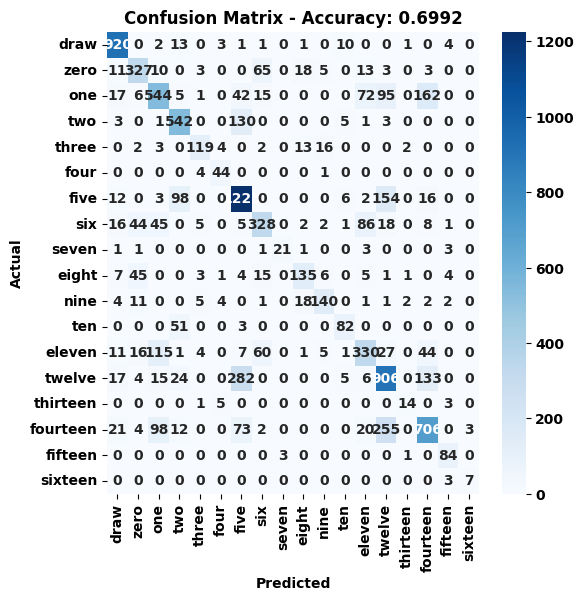

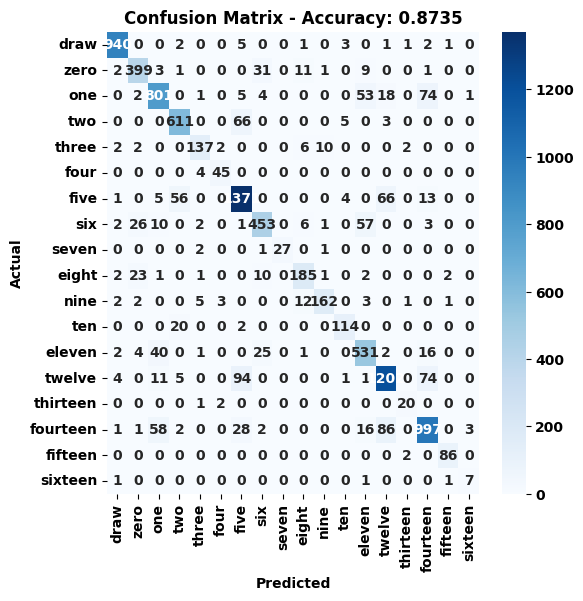

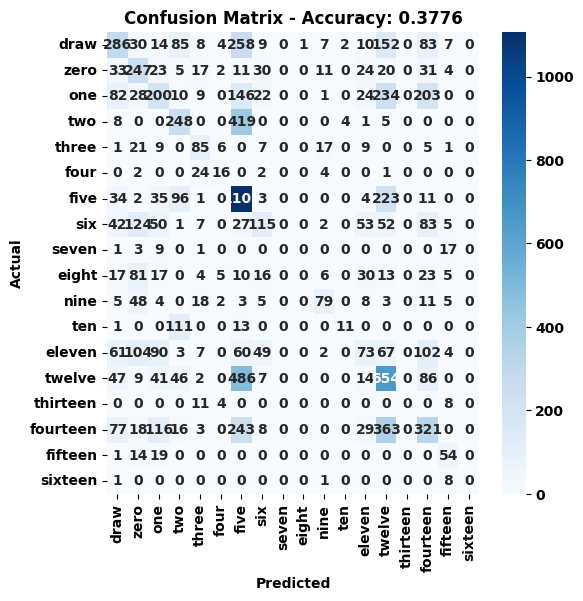

...

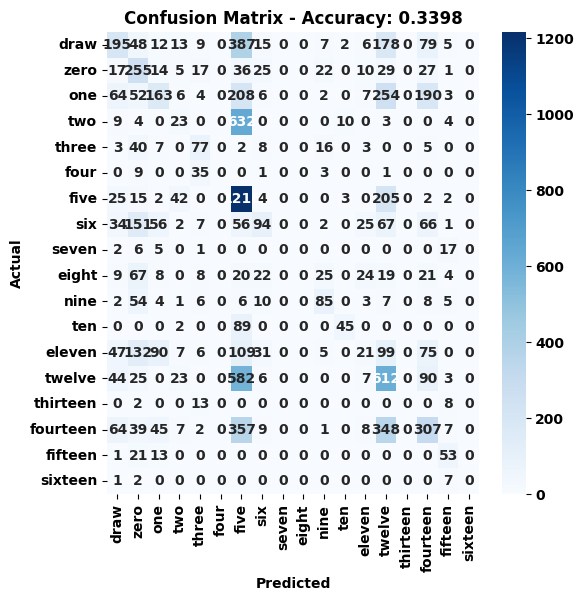

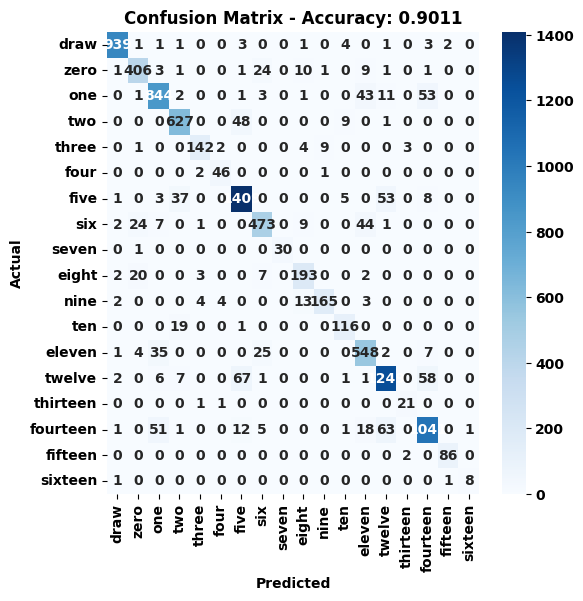

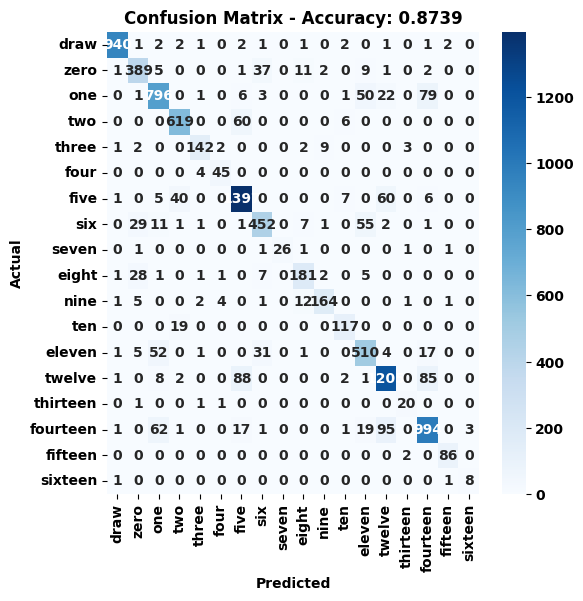

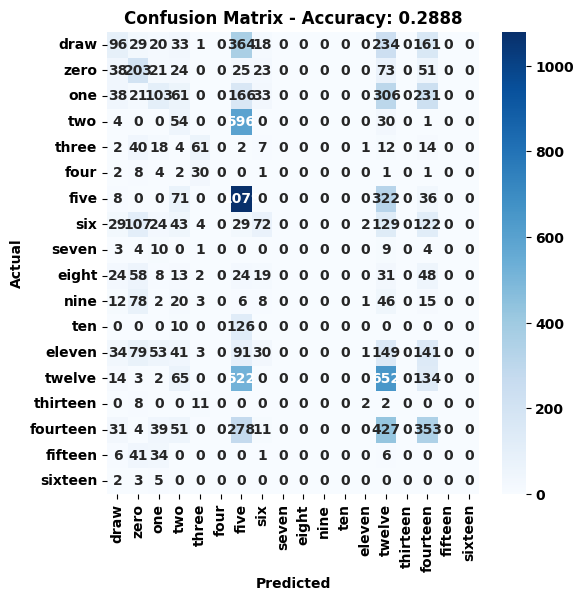

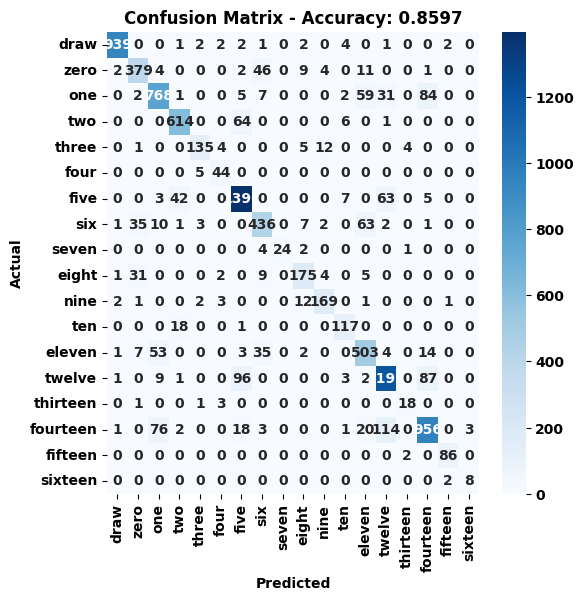

    subsample  n_estimators  max_depth  learning_rate  lambda  \
0         0.8           400          8           0.01   0.500   
1         0.8           200         15           0.70   1.100   
2         0.8            80          5           0.20   0.500   
3         0.8            30         10           0.50   1.100   
4         0.8            30          2           0.20   0.100   
5         0.8            20          8           0.50   0.900   
6         1.0            40          5           0.20   0.500   
7         0.8            80          2           0.50   0.900   
8         1.0            80          2           0.20   0.900   
9         0.8            80         15           0.50   1.000   
10        0.8            30          5           0.01   0.001   
11        0.8            20          8           0.20   0.001   
12        0.8            40         15           0.70   0.001   
13        0.8            40          5           0.70   0.100   
14        1.0            

In [19]:
import pandas as pd
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np

# Assuming you have a list of models and their hyperparameters
hyperparameters_list = random_search_xgb.cv_results_['params'].copy()


accuracies = []


for i in range(len(hyperparameters_list)):
    hyperparameters = hyperparameters_list[i].copy()
    model = xgb.XGBClassifier(**hyperparameters,  random_state=42)
    
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, predictions)
    
    # Store hyperparameters and accuracy
    hyperparameters['Accuracy'] = accuracy
    accuracies.append(hyperparameters)
    cm = confusion_matrix(y_test, predictions)

    # Plot confusion matrix
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True,fmt="d", cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - Accuracy: {accuracy:.4f}")
    folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/boosting'

    # Specify the file name and join it with the folder path
    file_path = os.path.join(folder_path, f'XGBClassifier{accuracy}.png')

    # Save the plot
    plt.savefig(file_path)
    plt.show()
# Create a DataFrame
results_df = pd.DataFrame(accuracies)

# Display the results
print(results_df)

In [20]:
from IPython.display import display
pd.set_option('display.max_rows', None)
display(results_df)

,subsample,n_estimators,max_depth,learning_rate,lambda,colsample_bytree,Accuracy
0,0.8,400,8,0.01,0.500,0.8,0.731720
1,0.8,200,15,0.70,1.100,1.0,0.889621
2,0.8,80,5,0.20,0.500,0.8,0.699212
3,0.8,30,10,0.50,1.100,1.0,0.873528
4,0.8,30,2,0.20,0.100,0.8,0.377579
5,0.8,20,8,0.50,0.900,1.0,0.820283
6,1.0,40,5,0.20,0.500,1.0,0.647694
7,0.8,80,2,0.50,0.900,0.8,0.512150
8,1.0,80,2,0.20,0.900,1.0,0.447889
9,0.8,80,15,0.50,1.000,1.0,0.890377


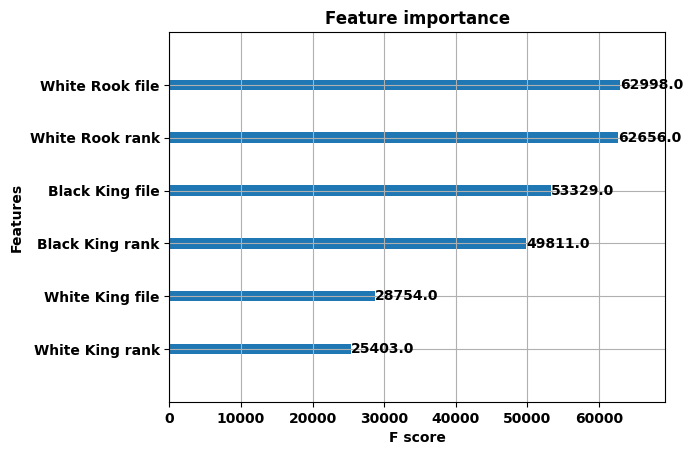

In [21]:
import xgboost as xgb
import matplotlib.pyplot as plt
import os
import numpy as np

# Get the best hyperparameters
best_hyperparameters_xgb = random_search_xgb.best_params_

# Instantiate XGBClassifier with the best hyperparameters
xgb_model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **best_hyperparameters_xgb, random_state=42)

# Fit the model
xgb_model.fit(X, y)

# Plot feature importances for XGBoost
xgb.plot_importance(xgb_model)

folder_path = 'C:/Users/rasyd/Documents/fys-stk4155/project3/figure/krkopt/f1_micro/boosting'

# Specify the file name and join it with the folder path
file_path = os.path.join(folder_path, f'XGBClassifier_variable.png')

# Save the plot
plt.savefig(file_path)
plt.show()
